In [1]:
import numpy as np
import random
import sys
import torch
import matplotlib.pyplot as plt

def randPair(s,e):
    return np.random.randint(s,e), np.random.randint(s,e)

class BoardPiece:

    def __init__(self, name, code, pos):
        self.name = name #name of the piece
        self.code = code #an ASCII character to display on the board
        self.pos = pos #2-tuple e.g. (1,4)

class BoardMask:

    def __init__(self, name, mask, code):
        self.name = name
        self.mask = mask
        self.code = code

    def get_positions(self): #returns tuple of arrays
        return np.nonzero(self.mask)

def zip_positions2d(positions): #positions is tuple of two arrays
    x,y = positions
    return list(zip(x,y))

class GridBoard:

    def __init__(self, size=4):
        self.size = size #Board dimensions, e.g. 4 x 4
        self.components = {} #name : board piece
        self.masks = {}

    def addPiece(self, name, code, pos=(0,0)):
        newPiece = BoardPiece(name, code, pos)
        self.components[name] = newPiece

    #basically a set of boundary elements
    def addMask(self, name, mask, code):
        #mask is a 2D-numpy array with 1s where the boundary elements are
        newMask = BoardMask(name, mask, code)
        self.masks[name] = newMask

    def movePiece(self, name, pos):
        move = True
        for _, mask in self.masks.items():
            if pos in zip_positions2d(mask.get_positions()):
                move = False
        if move:
            self.components[name].pos = pos

    def delPiece(self, name):
        del self.components['name']

    def render(self):
        dtype = '<U2'
        displ_board = np.zeros((self.size, self.size), dtype=dtype)
        displ_board[:] = ' '

        for name, piece in self.components.items():
            displ_board[piece.pos] = piece.code

        for name, mask in self.masks.items():
            displ_board[mask.get_positions()] = mask.code

        return displ_board

    def render_np(self):
        num_pieces = len(self.components) + len(self.masks)
        displ_board = np.zeros((num_pieces, self.size, self.size), dtype=np.uint8)
        layer = 0
        for name, piece in self.components.items():
            pos = (layer,) + piece.pos
            displ_board[pos] = 1
            layer += 1

        for name, mask in self.masks.items():
            x,y = self.masks['boundary'].get_positions()
            z = np.repeat(layer,len(x))
            a = (z,x,y)
            displ_board[a] = 1
            layer += 1
        return displ_board

def addTuple(a,b):
    return tuple([sum(x) for x in zip(a,b)])

In [2]:

class Gridworld:

    def __init__(self, size=4, mode='static'):
        if size >= 4:
            self.board = GridBoard(size=size)
        else:
            print("Minimum board size is 4. Initialized to size 4.")
            self.board = GridBoard(size=4)

        #Add pieces, positions will be updated later
        self.board.addPiece('Player','P',(0,0))
        self.board.addPiece('Goal','+',(1,0))
        self.board.addPiece('Pit','-',(2,0))
        self.board.addPiece('Wall','W',(3,0))

        if mode == 'static':
            self.initGridStatic()
        elif mode == 'player':
            self.initGridPlayer()
        else:
            self.initGridRand()

    #Initialize stationary grid, all items are placed deterministically
    def initGridStatic(self):
        #Setup static pieces
        self.board.components['Player'].pos = (0,3) #Row, Column
        self.board.components['Goal'].pos = (0,0)
        self.board.components['Pit'].pos = (0,1)
        self.board.components['Wall'].pos = (1,1)

    #Check if board is initialized appropriately (no overlapping pieces)
    #also remove impossible-to-win boards
    def validateBoard(self):
        valid = True

        player = self.board.components['Player']
        goal = self.board.components['Goal']
        wall = self.board.components['Wall']
        pit = self.board.components['Pit']

        all_positions = [piece for name,piece in self.board.components.items()]
        all_positions = [player.pos, goal.pos, wall.pos, pit.pos]
        if len(all_positions) > len(set(all_positions)):
            return False

        corners = [(0,0),(0,self.board.size), (self.board.size,0), (self.board.size,self.board.size)]
        #if player is in corner, can it move? if goal is in corner, is it blocked?
        if player.pos in corners or goal.pos in corners:
            val_move_pl = [self.validateMove('Player', addpos) for addpos in [(0,1),(1,0),(-1,0),(0,-1)]]
            val_move_go = [self.validateMove('Goal', addpos) for addpos in [(0,1),(1,0),(-1,0),(0,-1)]]
            if 0 not in val_move_pl or 0 not in val_move_go:
                #print(self.display())
                #print("Invalid board. Re-initializing...")
                valid = False

        return valid

    #Initialize player in random location, but keep wall, goal and pit stationary
    def initGridPlayer(self):
        #height x width x depth (number of pieces)
        self.initGridStatic()
        #place player
        self.board.components['Player'].pos = randPair(0,self.board.size)

        if (not self.validateBoard()):
            #print('Invalid grid. Rebuilding..')
            self.initGridPlayer()

    #Initialize grid so that goal, pit, wall, player are all randomly placed
    def initGridRand(self):
        #height x width x depth (number of pieces)
        self.board.components['Player'].pos = randPair(0,self.board.size)
        self.board.components['Goal'].pos = randPair(0,self.board.size)
        self.board.components['Pit'].pos = randPair(0,self.board.size)
        self.board.components['Wall'].pos = randPair(0,self.board.size)

        if (not self.validateBoard()):
            #print('Invalid grid. Rebuilding..')
            self.initGridRand()

    def validateMove(self, piece, addpos=(0,0)):
        outcome = 0 #0 is valid, 1 invalid, 2 lost game
        pit = self.board.components['Pit'].pos
        wall = self.board.components['Wall'].pos
        new_pos = addTuple(self.board.components[piece].pos, addpos)
        if new_pos == wall:
            outcome = 1 #block move, player can't move to wall
        elif max(new_pos) > (self.board.size-1):    #if outside bounds of board
            outcome = 1
        elif min(new_pos) < 0: #if outside bounds
            outcome = 1
        elif new_pos == pit:
            outcome = 2

        return outcome

    def makeMove(self, action):
        #need to determine what object (if any) is in the new grid spot the player is moving to
        #actions in {u,d,l,r}
        def checkMove(addpos):
            if self.validateMove('Player', addpos) in [0,2]:
                new_pos = addTuple(self.board.components['Player'].pos, addpos)
                self.board.movePiece('Player', new_pos)

        if action == 'u': #up
            checkMove((-1,0))
        elif action == 'd': #down
            checkMove((1,0))
        elif action == 'l': #left
            checkMove((0,-1))
        elif action == 'r': #right
            checkMove((0,1))
        else:
            pass

    def reward(self):
        if (self.board.components['Player'].pos == self.board.components['Pit'].pos):
            return -10
        elif (self.board.components['Player'].pos == self.board.components['Goal'].pos):
            return 10
        else:
            return -1

    def display(self):
        return self.board.render()

## 1.DQN

In [3]:

l1 = 64
l2 = 150
l3 = 100
l4 = 4

model = torch.nn.Sequential(
    torch.nn.Linear(l1, l2),
    torch.nn.ReLU(),
    torch.nn.Linear(l2, l3),
    torch.nn.ReLU(),
    torch.nn.Linear(l3,l4)
)
loss_fn = torch.nn.MSELoss()

learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

gamma = 0.9
epsilon = 1.0

epochs = 1000

In [4]:
action_set = {
    0: 'u',
    1: 'd',
    2: 'l',
    3: 'r',
}

def epsilon_greedy(q,epsilon) -> int:
    if np.random.rand() > epsilon:
        return np.argmax(q)
    return np.random.randint(4)

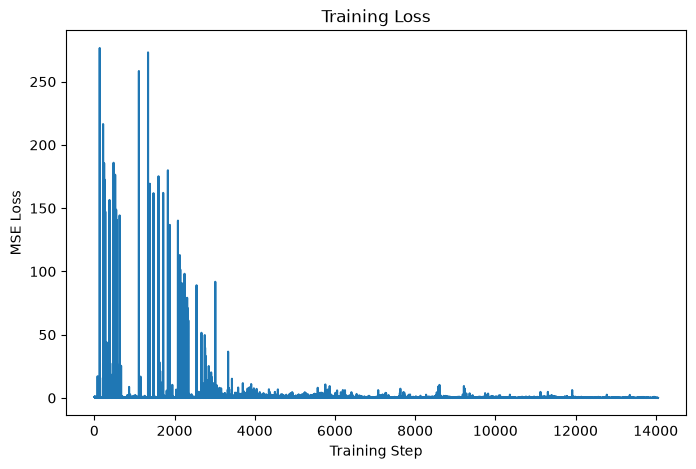

In [5]:
losses = []
size = 4
for _ in range(epochs):
    game = Gridworld(size, 'player')

    while True:
        state_ = game.board.render_np().reshape(-1) + np.random.rand(4 * size**2) / 10 # add some salt
        state1 = torch.from_numpy(state_).float() # tensor
        q_val1 = model(state1) # 
        choice_ = epsilon_greedy(q_val1.detach().numpy(), epsilon)
        action = action_set[choice_]

        game.makeMove(action)
        reward = game.reward()
        state_ = game.board.render_np().reshape(-1) + np.random.rand(4 * size**2) / 10 # add some salt
        state2 = torch.from_numpy(state_).float()
        with torch.no_grad():
            q_val2 = model(state2)
        target = reward + gamma * torch.max(q_val2) if reward == -1 else torch.tensor(reward)
        
        loss = loss_fn(q_val1[choice_], target)
        optimizer.zero_grad()
        loss.backward()
        losses.append(loss.item())
        optimizer.step()


        if reward != -1: break
    if epsilon > 0.1:
        epsilon -= (1/epochs)


fig, ax = plt.subplots(figsize=(8,5))

ax.plot(losses)

ax.set_title("Training Loss")
ax.set_xlabel("Training Step")
ax.set_ylabel("MSE Loss")

plt.show()



In [6]:
# use the train network to act
def test_model(model, mode='player'):
    game = Gridworld(size, mode)
    move = 1
    for _ in range(15):
        print(game.display())
        state_ = game.board.render_np().reshape(1,64) + np.random.rand(1,4 * size ** 2)/10
        state1 = torch.from_numpy(state_).float()
        q_val1 = model(state1)
        action_ = np.argmax(q_val1.detach().numpy())
        action = action_set[action_]
        print(f'#move: take action {move, action}')
        move += 1
        game.makeMove(action)
        reward = game.reward()
        if reward == 10: return 1
        if reward != -1: return 0
    return 0

# def test_model(model, mode='static'):
#     i = 0
#     test_game = Gridworld(mode=mode)
#     state_ = test_game.board.render_np().reshape(1,64) + np.random.rand(1,64)/10.0
#     state = torch.from_numpy(state_).float()
#     status = 1
#     while(status == 1): #A
#         qval = model(state)
#         qval_ = qval.data.numpy()
#         action_ = np.argmax(qval_) #B
#         action = action_set[action_]
#         test_game.makeMove(action)
#         state_ = test_game.board.render_np().reshape(1,64) + np.random.rand(1,64)/10.0
#         state = torch.from_numpy(state_).float()
#         reward = test_game.reward()
#         if reward != -1:
#             if reward > 0:
#                 status = 2
#             else:
#                 status = 0
    
#     win = True if status == 2 else False
#     return win
test_model(model, 'static')


[['+' '-' ' ' 'P']
 [' ' 'W' ' ' ' ']
 [' ' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (1, 'd')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' 'P']
 [' ' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (2, 'd')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 [' ' ' ' ' ' 'P']
 [' ' ' ' ' ' ' ']]
#move: take action (3, 'l')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 [' ' ' ' 'P' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (4, 'l')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 [' ' 'P' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (5, 'l')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 ['P' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (6, 'u')
[['+' '-' ' ' ' ']
 ['P' 'W' ' ' ' ']
 [' ' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (7, 'u')


1

In [7]:
test_model(model, 'player')

[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 [' ' ' ' 'P' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (1, 'l')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 [' ' 'P' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (2, 'l')
[['+' '-' ' ' ' ']
 [' ' 'W' ' ' ' ']
 ['P' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (3, 'u')
[['+' '-' ' ' ' ']
 ['P' 'W' ' ' ' ']
 [' ' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (4, 'u')


1

In [8]:
test_model(model, 'random')
# use not_batch and random so that the accuray is too low
# about 50% or so

[['-' ' ' ' ' 'W']
 [' ' ' ' ' ' ' ']
 [' ' ' ' ' ' '+']
 [' ' 'P' ' ' ' ']]
#move: take action (1, 'u')
[['-' ' ' ' ' 'W']
 [' ' ' ' ' ' ' ']
 [' ' 'P' ' ' '+']
 [' ' ' ' ' ' ' ']]
#move: take action (2, 'l')
[['-' ' ' ' ' 'W']
 [' ' ' ' ' ' ' ']
 ['P' ' ' ' ' '+']
 [' ' ' ' ' ' ' ']]
#move: take action (3, 'u')
[['-' ' ' ' ' 'W']
 ['P' ' ' ' ' ' ']
 [' ' ' ' ' ' '+']
 [' ' ' ' ' ' ' ']]
#move: take action (4, 'u')


0

## 2.DQN + Batch 
for random /
Batch memory to solve catastrophic forgetting

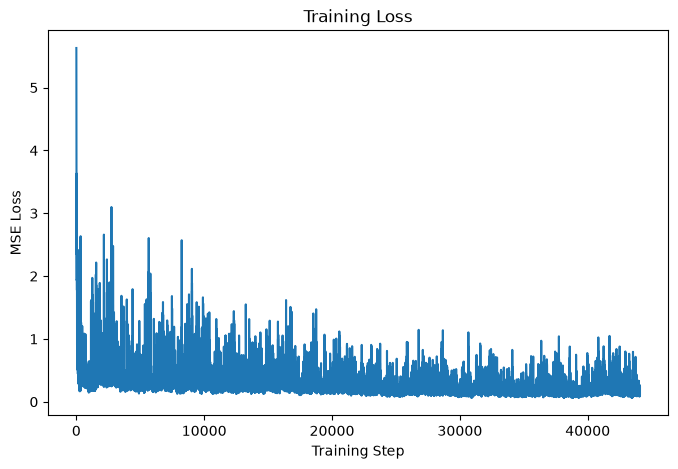

In [9]:
from collections import deque
epochs = 5000
losses = []
mem_size = 1000
batch_size = 200
size = 4
replay = deque(maxlen=mem_size)
max_moves = 50
h = 0

for _ in range(epochs):
    game = Gridworld(size, 'random')
    mov = 0

    while True:
        mov += 1
        state_ = game.board.render_np().reshape(1,64) + np.random.rand(4 * size**2) / 10 # add some salt
        state1 = torch.from_numpy(state_).float() # tensor
        q_val1 = model(state1) # 
        action_ = epsilon_greedy(q_val1.detach().numpy(), epsilon)
        action = action_set[action_]

        game.makeMove(action)
        reward = game.reward()
        done = 1 if reward > 0 else 0
        state_ = game.board.render_np().reshape(1,64) + np.random.rand(4 * size**2) / 10 # add some salt
        state2 = torch.from_numpy(state_).float()

        replay.append((state1, action_, state2, reward, done))

        if len(replay) > batch_size:

            minibatch = random.sample(replay, batch_size)
            state1_batch = torch.cat([s1 for (s1, a, s2, r, d) in minibatch])
            action_batch = torch.tensor([a for (s1, a, s2, r, d) in minibatch])
            reward_batch = torch.tensor([r for (s1, a, s2, r, d) in minibatch])
            state2_batch = torch.cat([s2 for (s1, a, s2, r, d) in minibatch])
            done_batch = torch.tensor([d for (s1, a, s2, r, d) in minibatch])

            Q1 = model(state1_batch)
            with torch.no_grad():
                Q2 = model(state2_batch)
            
            Y = reward_batch +  gamma * ((1 - done_batch) * torch.max(Q2, dim=1)[0]) # torch.max() return max and indice 
            X = Q1.gather(dim=1, index=action_batch.long().unsqueeze(dim=1)).squeeze()
            
            loss = loss_fn(X, Y)
            optimizer.zero_grad()
            loss.backward()
            losses.append(loss.item())
            optimizer.step()


        if reward != -1 or mov > max_moves: break

    if epsilon > 0.1:
        epsilon -= (1/epochs)


fig, ax = plt.subplots(figsize=(8,5))

ax.plot(losses)

ax.set_title("Training Loss")
ax.set_xlabel("Training Step")
ax.set_ylabel("MSE Loss")

plt.show()



In [10]:
test_model(model, 'random')

[[' ' ' ' ' ' 'P']
 [' ' '-' ' ' ' ']
 [' ' ' ' 'W' '+']
 [' ' ' ' ' ' ' ']]
#move: take action (1, 'd')
[[' ' ' ' ' ' ' ']
 [' ' '-' ' ' 'P']
 [' ' ' ' 'W' '+']
 [' ' ' ' ' ' ' ']]
#move: take action (2, 'd')


1

In [15]:
max_games = 10000
wins = 0 
for i in range(max_games):  
    wins += test_model(model, mode='random') 
    win_perc = float(wins) / float(max_games) 
    print("Games played: {0}, # of wins: {1}".format(max_games,wins)) 
    print("Win percentage: {}".format(win_perc*100))



[[' ' ' ' ' ' ' ']
 [' ' ' ' 'P' ' ']
 [' ' ' ' '+' ' ']
 [' ' 'W' '-' ' ']]
#move: take action (1, 'd')
Games played: 10000, # of wins: 1
Win percentage: 0.01
[[' ' ' ' ' ' ' ']
 ['P' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']
 ['-' '+' 'W' ' ']]
#move: take action (1, 'd')
[[' ' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']
 ['P' ' ' ' ' ' ']
 ['-' '+' 'W' ' ']]
#move: take action (2, 'r')
[[' ' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']
 [' ' 'P' ' ' ' ']
 ['-' '+' 'W' ' ']]
#move: take action (3, 'd')
Games played: 10000, # of wins: 2
Win percentage: 0.02
[[' ' ' ' ' ' '+']
 ['-' ' ' ' ' ' ']
 ['W' ' ' ' ' ' ']
 [' ' ' ' 'P' ' ']]
#move: take action (1, 'r')
[[' ' ' ' ' ' '+']
 ['-' ' ' ' ' ' ']
 ['W' ' ' ' ' ' ']
 [' ' ' ' ' ' 'P']]
#move: take action (2, 'u')
[[' ' ' ' ' ' '+']
 ['-' ' ' ' ' ' ']
 ['W' ' ' ' ' 'P']
 [' ' ' ' ' ' ' ']]
#move: take action (3, 'u')
[[' ' ' ' ' ' '+']
 ['-' ' ' ' ' 'P']
 ['W' ' ' ' ' ' ']
 [' ' ' ' ' ' ' ']]
#move: take action (4, 'u')
Games played: 10000, # of wins: 3
Win percentage: 

## DQN with experience replay and target network

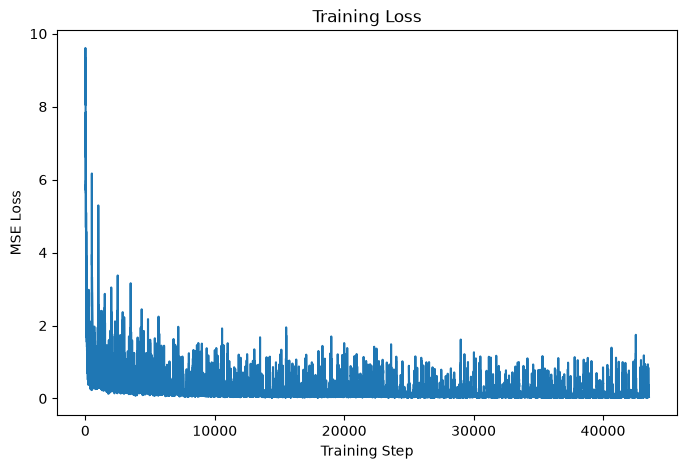

In [12]:
import copy 
model1 = torch.nn.Sequential(
    torch.nn.Linear(l1, l2), 
    torch.nn.ReLU(), 
    torch.nn.Linear(l2, l3), 
    torch.nn.ReLU(), 
    torch.nn.Linear(l3,l4) 
)

model2 = copy.deepcopy(model1)
model2.load_state_dict(model1.state_dict())
sync_freq = 500
step = 0
epsilon = 1.0 
loss_fn = torch.nn.MSELoss() 
learning_rate = 1e-3 
optimizer = torch.optim.Adam(model1.parameters(), lr=learning_rate)

epochs = 5000
losses = []
mem_size = 1000
batch_size = 200
size = 4
replay = deque(maxlen=mem_size)
max_moves = 50
h = 0

for _ in range(epochs):
    game = Gridworld(size, 'random')
    mov = 0
    

    for mov in range(max_moves):

        state_ = game.board.render_np().reshape(1,64) + np.random.rand(4 * size**2) / 10 # add some salt
        state1 = torch.from_numpy(state_).float() # tensor
        q_val1 = model1(state1) # 
        action_ = epsilon_greedy(q_val1.detach().numpy(), epsilon)
        action = action_set[action_]

        game.makeMove(action)
        reward = game.reward()
        done = 1 if reward != -1 else 0
        state_ = game.board.render_np().reshape(1,64) + np.random.rand(4 * size**2) / 10 # add some salt
        state2 = torch.from_numpy(state_).float()

        replay.append((state1, action_, state2, reward, done))

        if len(replay) > batch_size:

            minibatch = random.sample(replay, batch_size)
            state1_batch = torch.cat([s1 for (s1, a, s2, r, d) in minibatch])
            action_batch = torch.tensor([a for (s1, a, s2, r, d) in minibatch])
            reward_batch = torch.tensor([r for (s1, a, s2, r, d) in minibatch])
            state2_batch = torch.cat([s2 for (s1, a, s2, r, d) in minibatch])
            done_batch = torch.tensor([d for (s1, a, s2, r, d) in minibatch])

            Q1 = model1(state1_batch)
            with torch.no_grad():
                Q2 = model2(state2_batch)
            
            Y = reward_batch +  gamma * ((1 - done_batch) * torch.max(Q2, dim=1)[0]) # torch.max() return max and indice 
            X = Q1.gather(dim=1, index=action_batch.long().unsqueeze(dim=1)).squeeze()
            
            loss = loss_fn(X, Y)
            optimizer.zero_grad()
            loss.backward()
            losses.append(loss.item())
            optimizer.step()
            step += 1
            if step % sync_freq == 0:
                model2.load_state_dict(model1.state_dict())
            
        if reward != -1 : break



    if epsilon > 0.1:
        epsilon -= (1/epochs)


fig, ax = plt.subplots(figsize=(8,5))

ax.plot(losses)

ax.set_title("Training Loss")
ax.set_xlabel("Training Step")
ax.set_ylabel("MSE Loss")

plt.show()



In [16]:
max_games = 10000 
wins = 0 
for i in range(max_games):  
    wins += test_model(model1, mode='random') 
     
    win_perc = float(wins) / float(max_games) 
    print("Games played: {0}, # of wins: {1}".format(max_games,wins)) 
    print("Win percentage: {}".format(win_perc*100))

[['W' ' ' 'P' ' ']
 [' ' ' ' '+' ' ']
 [' ' ' ' ' ' '-']
 [' ' ' ' ' ' ' ']]
#move: take action (1, 'd')
Games played: 10000, # of wins: 1
Win percentage: 0.01
[[' ' 'P' '+' ' ']
 [' ' ' ' ' ' ' ']
 [' ' ' ' ' ' '-']
 [' ' 'W' ' ' ' ']]
#move: take action (1, 'r')
Games played: 10000, # of wins: 2
Win percentage: 0.02
[['P' ' ' ' ' ' ']
 [' ' ' ' ' ' 'W']
 [' ' '-' ' ' ' ']
 [' ' '+' ' ' ' ']]
#move: take action (1, 'd')
[[' ' ' ' ' ' ' ']
 ['P' ' ' ' ' 'W']
 [' ' '-' ' ' ' ']
 [' ' '+' ' ' ' ']]
#move: take action (2, 'd')
[[' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'W']
 ['P' '-' ' ' ' ']
 [' ' '+' ' ' ' ']]
#move: take action (3, 'd')
[[' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'W']
 [' ' '-' ' ' ' ']
 ['P' '+' ' ' ' ']]
#move: take action (4, 'r')
Games played: 10000, # of wins: 3
Win percentage: 0.03
[[' ' 'P' ' ' ' ']
 [' ' 'W' ' ' ' ']
 [' ' '-' ' ' ' ']
 [' ' ' ' ' ' '+']]
#move: take action (1, 'r')
[[' ' ' ' 'P' ' ']
 [' ' 'W' ' ' ' ']
 [' ' '-' ' ' ' ']
 [' ' ' ' ' ' '+']]
#move: take action (2, 